# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import tensorflow as tf

%matplotlib inline

In [6]:
# dataset = get_dataset("/home/workspace/data/waymo/training_and_validation/*.tfrecord")
# Running Sourcery on changed code, grouping rules, better login, and more

# tfrecord_path = "/home/workspace/data/waymo/training_and_validation/*.tfrecord"
tfrecord_path = "./data/train/*.tfrecord"
dataset = get_dataset(tfrecord_path)

INFO:tensorflow:Reading unweighted datasets: ['./data/train/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['./data/train/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 86


## Write a function to display an image and the bounding boxes

Implement the `display_images` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
def display_images(batch):
    # TODO - Your implementation here
    # pass
   
    img = batch['image'].numpy()
    img_h, img_w, _ = img.shape
   
    fig, ax = plt.subplots(1, 1, figsize=(20, 20))
    ax.imshow(img)
   
    bboxes = batch['groundtruth_boxes'].numpy()
    # to rectangle pixel coordinates
    bboxes[:, (0, 2)] *= img_h
    bboxes[:, (1, 3)] *= img_w
   
    # color mapping of classes: (vehicles red, pedestrians blue, cyclists green)
    colormap = {1:[1, 0, 0], 2:[0, 0, 1], 3:[0, 1, 0]}
    classes = batch['groundtruth_classes'].numpy()
   
    for bbox, classe in zip(bboxes, classes):
        y1, x1, y2, x2 = bbox
        try:
            rec = patches.Rectangle((x1, y1), (x2 - x1), (y2 - y1), edgecolor = colormap[classe], facecolor='none')
            ax.add_patch(rec)
        except KeyError:
            pass
    plt.axis('off')
    plt.show()
   
    return

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

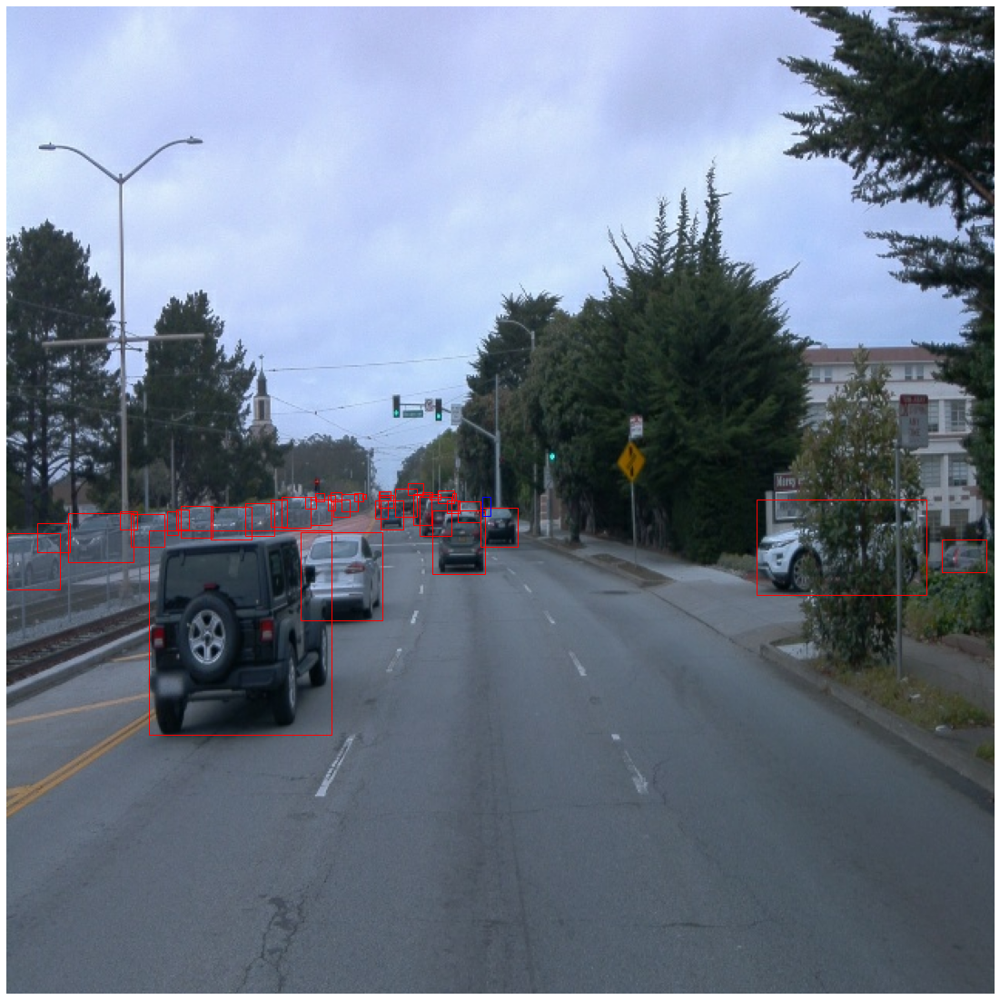

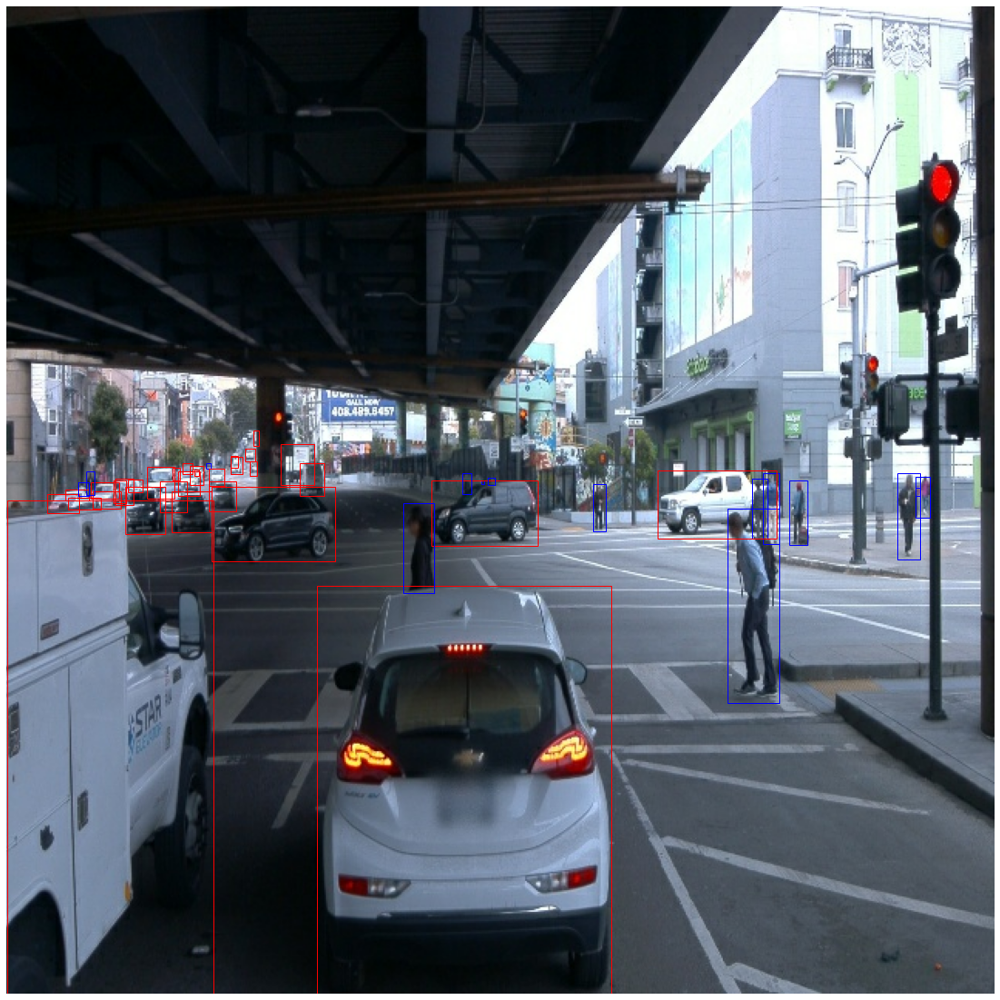

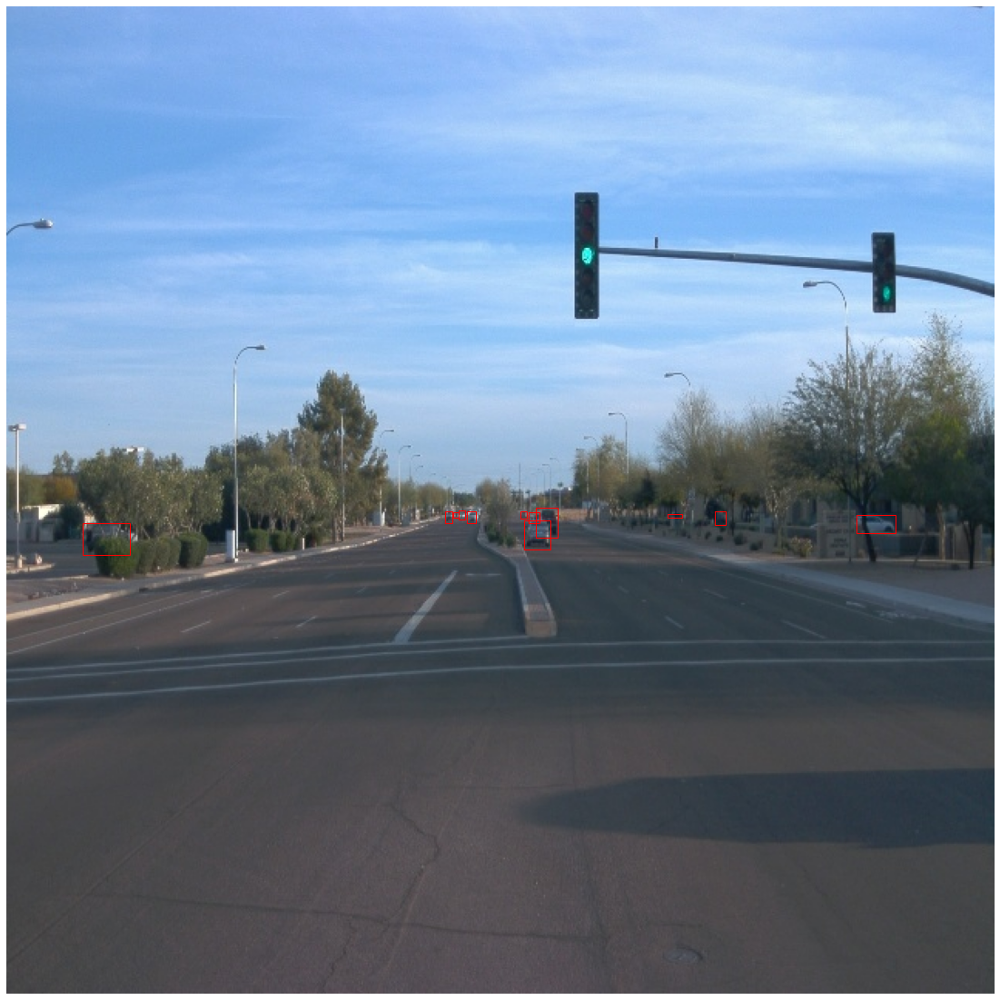

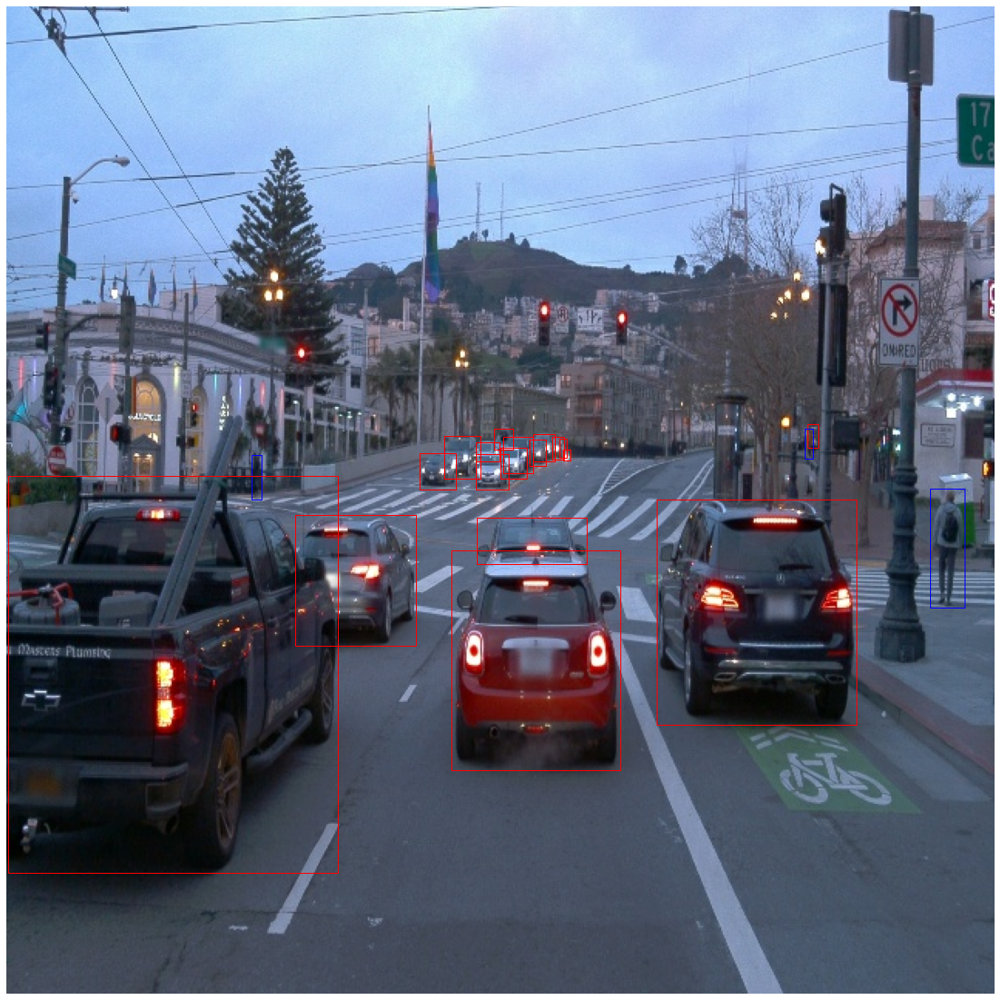

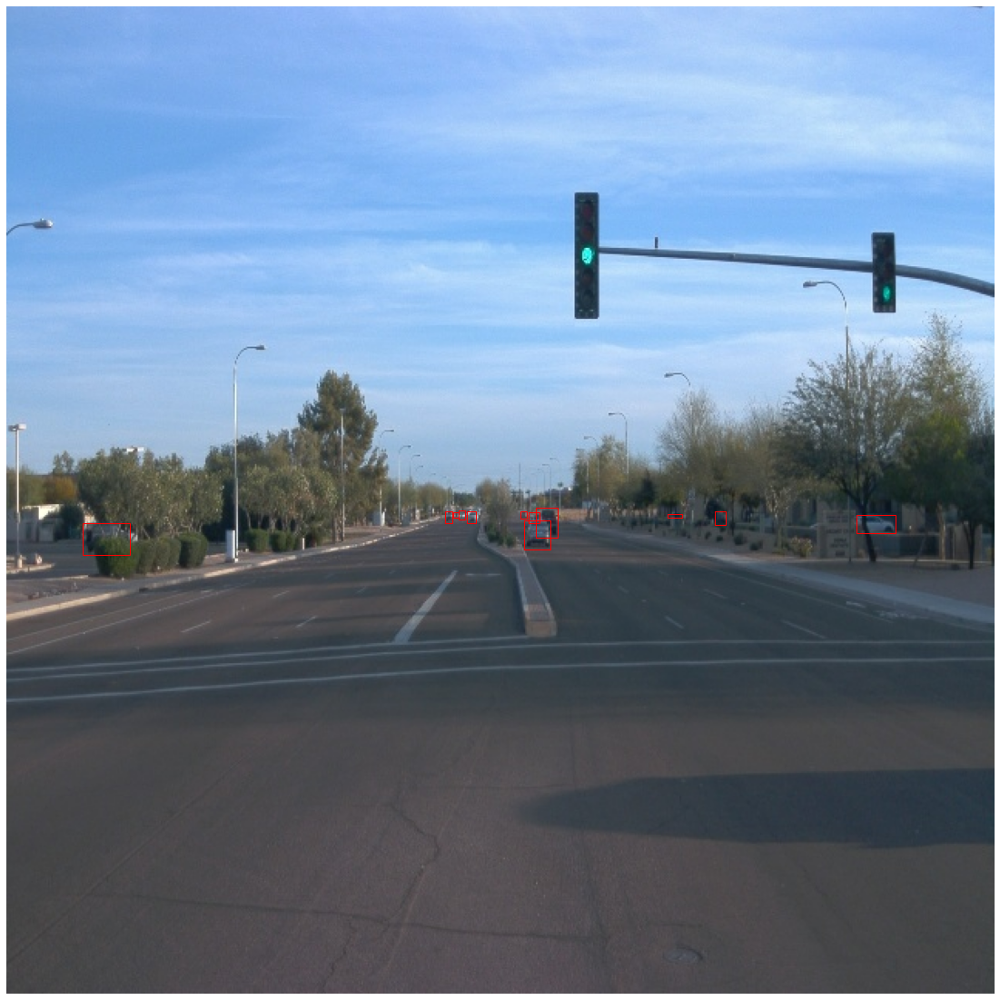

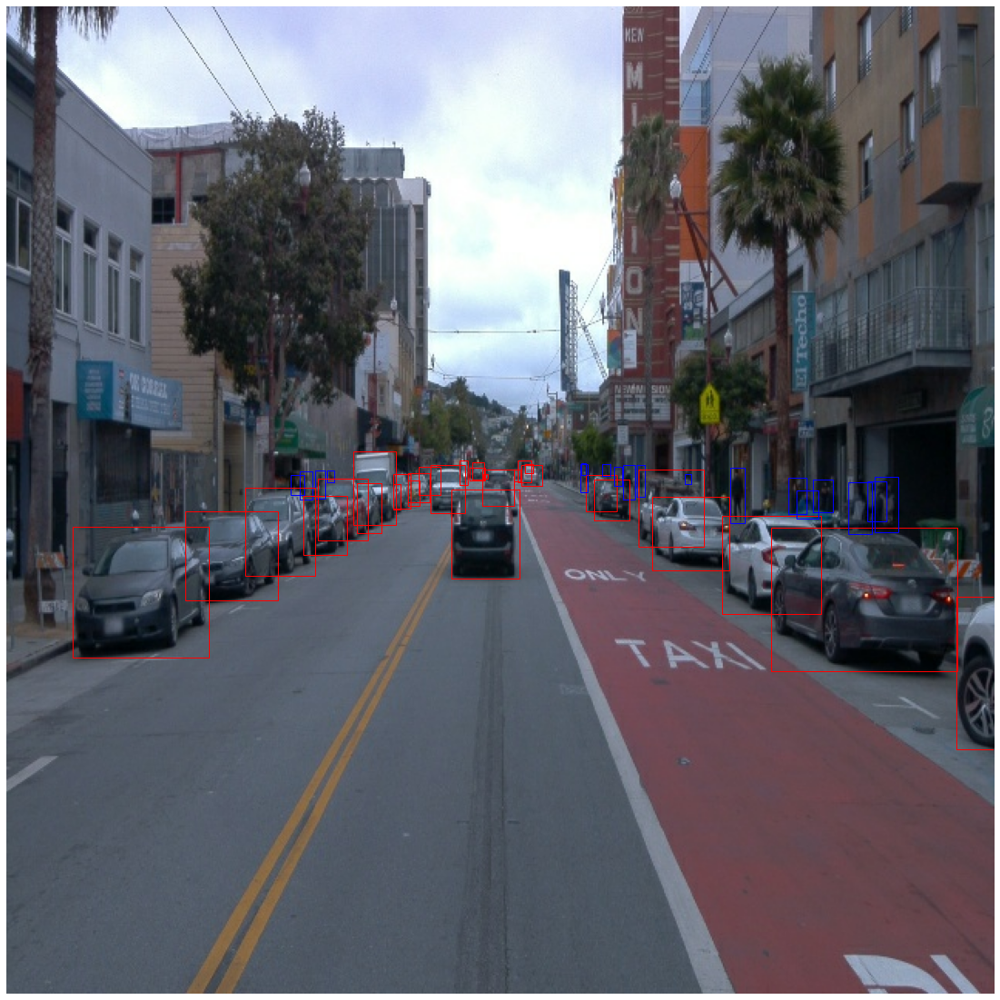

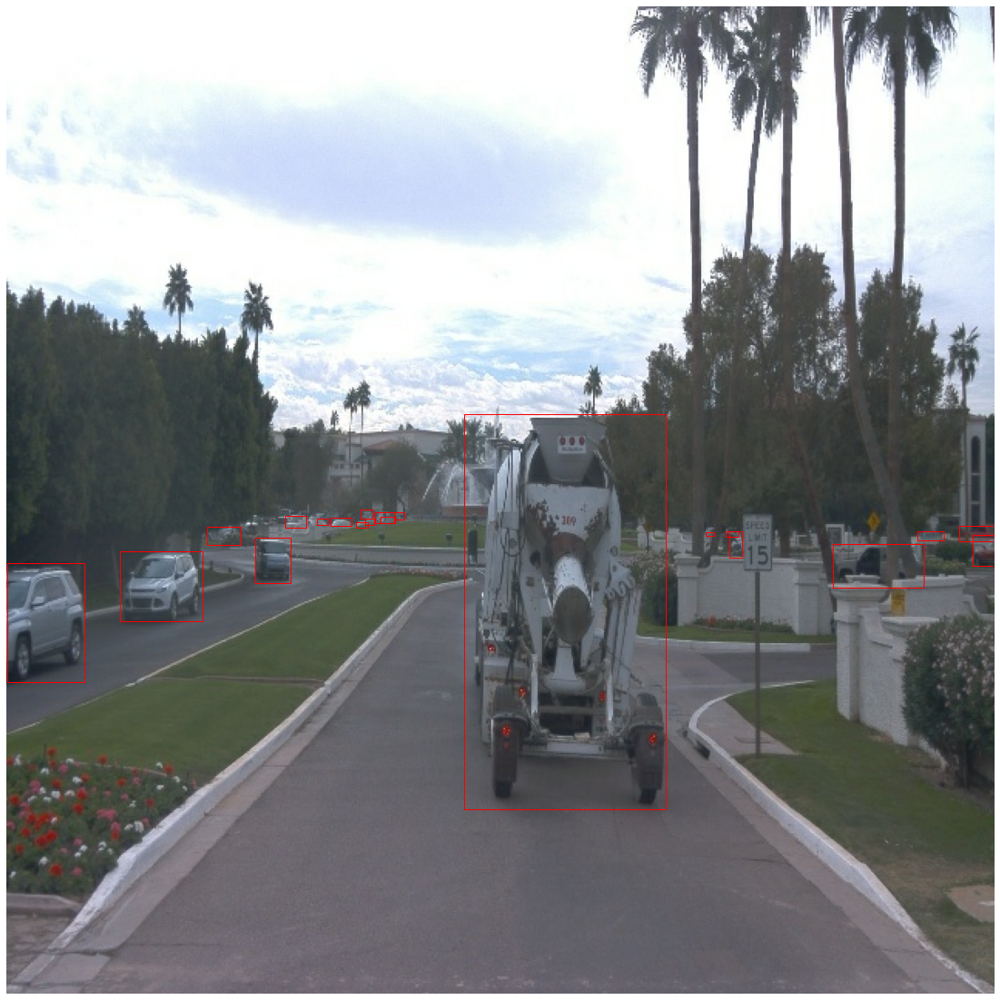

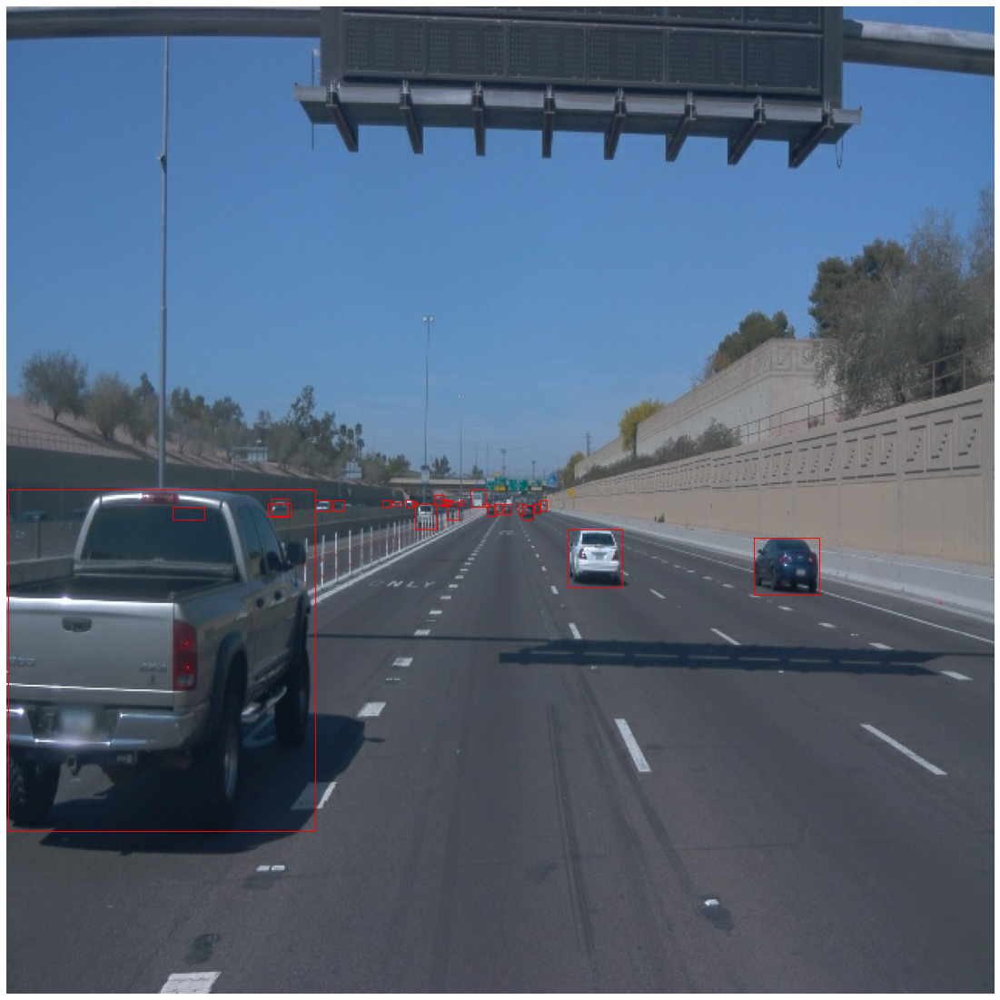

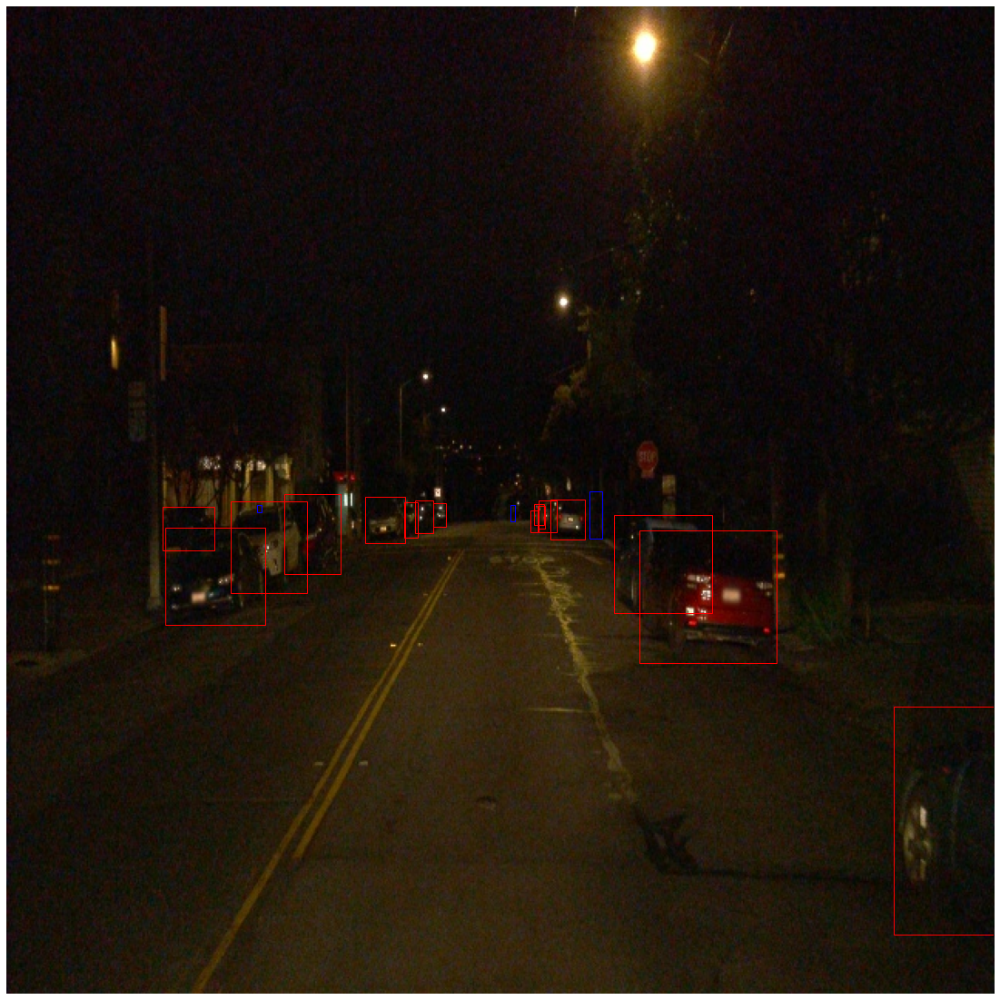

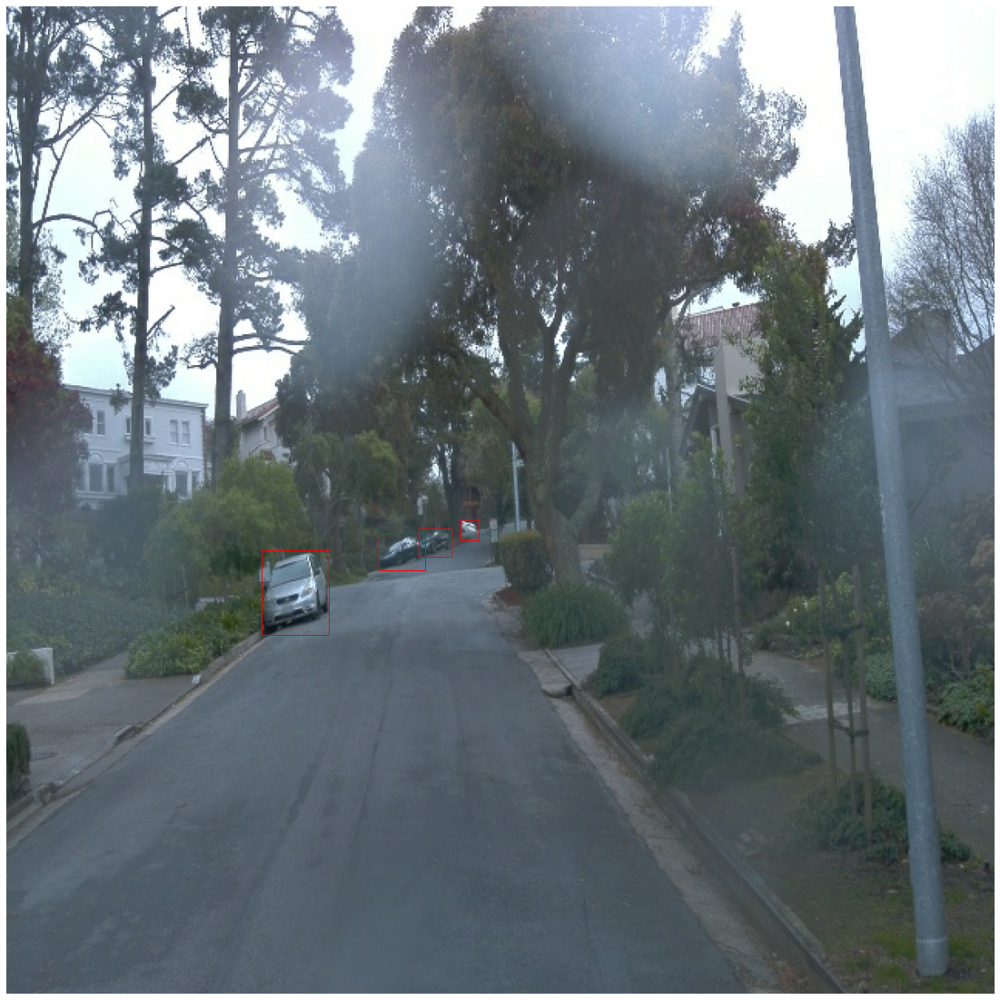

In [7]:
# Display 10 random images in dataset
dataset = dataset.shuffle(100)

for idx, batch in enumerate(dataset.take(10)):
    display_images(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

Total of bounding boxes: 1079
Bbox Distribution among images: {0: 48, 1: 40, 2: 34, 3: 18, 4: 66, 5: 0, 6: 4, 7: 15, 8: 33, 9: 1, 10: 2, 11: 8, 12: 15, 13: 18, 14: 18, 15: 8, 16: 35, 17: 28, 18: 18, 19: 16, 20: 25, 21: 76, 22: 7, 23: 25, 24: 2, 25: 49, 26: 38, 27: 21, 28: 18, 29: 1, 30: 12, 31: 1, 32: 35, 33: 58, 34: 14, 35: 29, 36: 16, 37: 14, 38: 12, 39: 48, 40: 30, 41: 1, 42: 30, 43: 31, 44: 2, 45: 28, 46: 12, 47: 6, 48: 1, 49: 12}

Class Distribution: 789 vehicle, 285 pedestrian, and 5 cyclist
Class Mean per image: 15.78 vehicle, 5.7 pedestrian, 0.1 cyclist
Class Std Deviation per image: 10.444692432044134 vehicle, 10.016486409914402 pedestrian, 0.2999999999999999 cyclist

Number of images without bounding boxes: 0


[Text(0, 0.5, 'Number of Bounding Boxes'), Text(0.5, 0, 'Number of Images')]

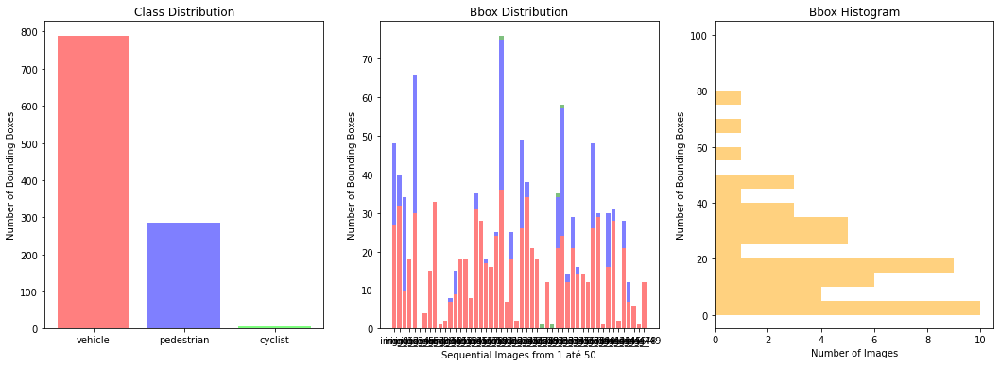

In [8]:
count_total = []
# count_batch_reset = {1:0, 2:0, 4:0}
count_batch = {1:0, 2:0, 4:0}
label = ['vehicle', 'pedestrian', 'cyclist']
colormap = [[1, 0, 0], [0, 0, 1], [0, 1, 0]]
without_bbox = 0

dataset = dataset.take(50)

for i, batch in enumerate(dataset):
    # count_batch = count_batch_reset
    count_batch = {1:0, 2:0, 4:0}
    classes = batch['groundtruth_classes'].numpy()
   
    for idx in classes:
        count_batch[idx] += 1
        if np.all((classes == 0)):
            without_bbox += 1
    count_total.append(list(count_batch.values()))
   
summ = np.sum((count_total), axis=1)

print(f'Total of bounding boxes: {np.sum(summ)}')
print(f'Bbox Distribution among images: {dict(enumerate(summ.flatten()))}\n')

lst = []
for i in range (len(summ)):
    lst.append('img_' + str(i))

cl_distr = np.sum((count_total), axis=0)
print(f'Class Distribution: {cl_distr[0]} {label[0]}, {cl_distr[1]} {label[1]}, and {cl_distr[2]} {label[2]}')

count_total = np.array(count_total)

mean = np.mean((count_total), axis=0)
print(f'Class Mean per image: {mean[0]} {label[0]}, {mean[1]} {label[1]}, {mean[2]} {label[2]}')

sdev = np.std((count_total), axis=0)
print(f'Class Std Deviation per image: {sdev[0]} {label[0]}, {sdev[1]} {label[1]}, {sdev[2]} {label[2]}')
print('')
print(f'Number of images without bounding boxes: {without_bbox}')

fig2, ax2 = plt.subplots(1, 3, figsize=(18, 6))
ax2[0].bar(label, cl_distr, align='center', alpha=0.5, color=colormap)
ax2[0].set(ylabel = 'Number of Bounding Boxes')
ax2[0].set_title('Class Distribution')

count_veh = count_total[:, 0]
count_ped = count_total[:, 1]
count_bic = count_total[:, 2]
bike = np.sum((count_veh, count_ped), axis=0)
ax2[1].bar(lst, count_veh, align='center', alpha=0.5, color='red')
ax2[1].bar(lst, count_ped, align='center', alpha=0.5, color='blue', bottom=count_veh)
ax2[1].bar(lst, count_bic, align='center', alpha=0.5, color='green', bottom=bike)
ax2[1].set_title('Bbox Distribution')
ax2[1].set(ylabel='Number of Bounding Boxes', xlabel='Sequential Images from 1 até 50')

bins = []
for i in range(0, 100 + 1, 5):
    bins.append(i)
ax2[2].hist(summ, bins=bins, orientation='horizontal', alpha=0.5, color='orange')
ax2[2].set_title('Bbox Histogram')
ax2[2].set(ylabel='Number of Bounding Boxes', xlabel='Number of Images')